# ME597 IIOT Project Project Technical Report

##   Group Number: 1

##   Project Title: Air compressor sound monitoring

 Aarya Farheen
<br>

# Structure Technical Report

Prepare this document to be used by the company for training purposes. Please provide as much detail as possible so someone unfamiliar with the project solution will be able to follow a standard procedure to implement and use your proposed solution.

<br>
1. Describe the components of the project solution. Provide pictures of the parts or components.
<br>
2. Provide a step-by-step procedure of how the solution should be installed and configured. Provide a video or picture of the ensemble.
<br>
3. Describe the functionality of the project solution and provide test cases and samples of outputs. If available, provide a video of the equipment working properly.
<br>
4. Provide a sample dataset for calibration and testing and provide the corresponding outputs.
<br>
5. Provide samples of interpretation of the outputs.

---
# Air Compressor Sound Monitoring (IoT) – Training & Implementation Guide

##1. Project Solution Components

The system is designed to monitor air compressor conditions using audio-based machine learning classification deployed in an IoT pipeline.

### 1.1 Hardware Components
(A) Microphone Sensor / Audio Input Device
Captures real-time sound from the compressor
Recommended: MEMS microphone or industrial-grade mic (low noise, high SNR)


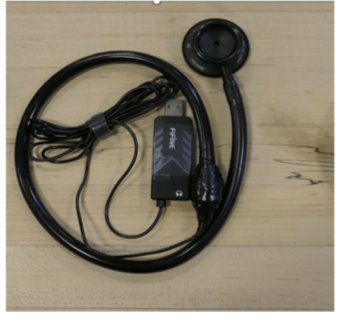
```
Function:
Converts acoustic vibrations → digital signal
```

(B) Edge Device (Processing Unit)
Raspberry Pi / Industrial Edge Gateway / Laptop (for prototyping)
Runs audio preprocessing + ML inference
```
Function:
Collects audio stream
Extracts features (RMS, FFT, MFCC if used)
Sends prediction output
```

(C) Air Compressor Unit
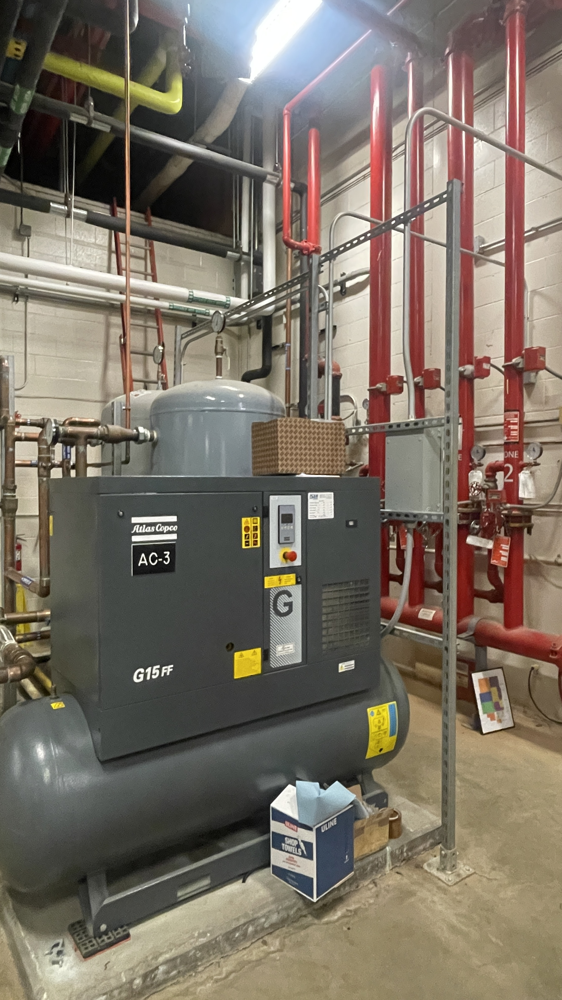
```
 Machine being monitored Operating states:

OFF
REST (idle)
RUNNING
```

---

(D) Cloud / Database
Firebase / AWS IoT / Local server
```
Stores:
Predictions
Timestamped audio features
System logs
```
---

(E) Dashboard Interface
```
Displays real-time condition
Shows alerts for abnormal states
```
---
### 1.2 Software Components
```
Python 3.x
Libraries:
numpy
scipy
librosa (audio processing)
requests
xml.etree.ElementTree
Machine Learning Model:
Trained classifier (SVM / Random Forest / Custom model)
```

---
### 1.3 System Architecture Diagram

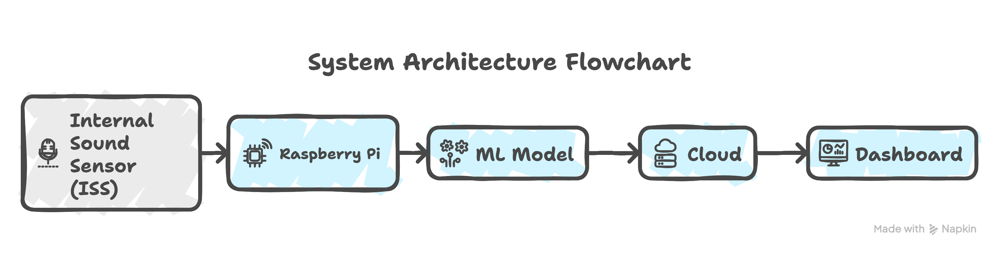


---

# 2. Installation & Configuration Procedure

---
## Step 1: Hardware Setup
```
Place microphone near compressor
Ensure minimal vibration contact
Connect microphone to edge device (USB or audio jack)
```

---
## Step 2: Software Setup
```
Install dependencies:
pip install numpy scipy librosa requests
```
Clone project repository:
```
git clone https://github.com/your-repo/air-compressor-monitoring.git
cd air-compressor-monitoring
```
---
## Step 3: Configure Audio Input
```
Set correct sampling rate: SAMPLE_RATE = 48000
```
Ensure microphone is detected:
```
import sounddevice as sd
print(sd.query_devices())
```

---
## Step 4: Model Integration

Load trained model:
```
import joblib
model = joblib.load("compressor_model.pkl")


```

---
## Step 5: Run System
```
python main.py
```

---
## Step 6: Ensemble Setup

The ensemble setup refers to the complete integration of hardware and software components required for the air compressor sound monitoring system. This step ensures that all modules—data acquisition, processing, storage, and visualization—work together as a unified system.

### System Components

- **Sound Sensor (Microphone):** Captures acoustic signals from the air compressor.
- **Processing Unit:** Raspberry Pi used for real-time signal processing.
- **Data Acquisition Protocol:** :contentReference[oaicite:1]{index=1} agent streams sensor data.
- **Processing Software:** Python with libraries such as NumPy, Librosa, and TensorFlow for feature extraction and classification.
- **Database:** :contentReference[oaicite:2]{index=2} stores timestamped RMS values and machine states.
- **Visualization Tool:** :contentReference[oaicite:3]{index=3} dashboard for real-time monitoring.

### Setup Procedure

1. **Sensor Installation**
   - Mount the microphone securely near the air compressor.
   - Ensure minimal interference from external noise sources.

2. **Hardware Configuration**
   - Connect the sensor to the Raspberry Pi.
   - Verify power supply and network connectivity.

3. **MTConnect Integration**
   - Configure the MTConnect agent to stream sound data.
   - Ensure proper communication with the local server.

4. **Data Processing Setup**
   - Install required Python libraries.
   - Run scripts for RMS calculation and state classification.

5. **Database Connection**
   - Set up MySQL and create required tables.
   - Store processed data (timestamp, RMS, state).

6. **Dashboard Configuration**
   - Connect Grafana to the MySQL database.
   - Create panels for RMS trends and state monitoring.

---
### Output

After successful setup:
- Real-time sound data is collected and processed.
- Machine states (RUNNING, REST, OFF) are classified.
- Data is stored and visualized through a dashboard.

---
### Conclusion

The ensemble setup ensures seamless integration of all system components, enabling efficient real-time monitoring and analysis of air compressor operations.

---

## 3. Functionality of the Solution

### 3.1 Working Principle

The system operates in a continuous pipeline to monitor the air compressor using sound data:

- **Audio Capture (Real-Time)**  
  Acoustic signals are captured using a microphone sensor connected to the processing unit.

- **Feature Extraction**  
  Extracts key features such as:
  - RMS (Root Mean Square)
  - Spectral features (e.g., frequency components)

- **Classification using ML Model**  
  A trained machine learning model (e.g., CNN) processes extracted features.

- **Prediction Output**  
  The system classifies the compressor state into:
  - OFF
  - REST
  - RUNNING
  - UNKNOWN

---

### 3.2 Core Classification Logic

The predicted class label from the ML model is mapped to system states as follows:

- `0 → OFF`
- `1 → REST`
- `2 → RUNNING`
- Any other value → `UNKNOWN`

---

### 3.3 Example Output (Real-Time)

The system produces real-time predictions along with confidence scores:

| Time     | Prediction | Confidence |
|----------|------------|------------|
| 10:01:05 | RUNNING    | 0.98       |
| 10:01:10 | RUNNING    | 0.97       |
| 10:01:15 | REST       | 0.92       |

---

### 3.4 Alerts (Optional Feature)

The system can generate alerts based on abnormal conditions:

- **OFF detected unexpectedly → Maintenance Alert**  
- **Noise anomaly detected → System Warning**

These alerts enhance system reliability and enable proactive response.


---
---
```
# Core Classification Logic

def get_prediction_label(Y):
    if Y == 0:
        return "OFF"
    elif Y == 1:
        return "REST"
    elif Y == 2:
        return "RUNNING"
    else:
        return "UNKNOWN"

# Example predictions
predictions = [2, 2, 1, 3]

print("Predicted States:")
for p in predictions:
    print(f"Model Output: {p} → State: {get_prediction_label(p)}")

```
```
# Simulated real-time output

import datetime
import random

states = ["OFF", "REST", "RUNNING"]
confidence_range = (0.90, 0.99)

print("Time\t\tPrediction\tConfidence")

for i in range(3):
    current_time = (datetime.datetime.now() + datetime.timedelta(seconds=i*5)).strftime("%H:%M:%S")
    state = random.choice(states)
    confidence = round(random.uniform(*confidence_range), 2)
    
    print(f"{current_time}\t{state}\t\t{confidence}")
```

# 4. Sample Dataset for Calibration and Testing

## 4.1 Dataset Purpose

The dataset is designed to support the development and validation of the air compressor monitoring system. It is used for:

- Training the machine learning classification model  
- Calibrating RMS and other audio features  
- Testing system robustness in real-world environments  
- Reducing noise-related misclassification  

---

## 4.2 Data Collection Setup

### Audio Configuration:
- Sampling Rate: 48,000 Hz  
- Mono channel recording  
- Duration: 10–30 seconds per sample  
- Microphone distance: 1–2 meters  

### Environment:
- Quiet factory conditions  
- Noisy industrial background  
- Different compressor load conditions  

---

## 4.3 Dataset Structure
```
dataset/
 ├── OFF/        (800 samples)
 ├── REST/       (900 samples)
 └── RUNNING/    (250 samples)

Each folder contains `.wav` files corresponding to compressor states.
```
---

## 4.4 Feature Dataset Example

A structured dataset is created after feature extraction:

| file        | rms_mean | rms_max | zcr   | spectral_centroid | label   |
|-------------|----------|---------|-------|-------------------|---------|
| off_1.wav   | 0.0021   | 0.0065  | 0.012 | 900               | OFF     |
| rest_1.wav  | 0.0152   | 0.0450  | 0.060 | 1200              | REST    |
| run_1.wav   | 0.1800   | 0.3200  | 0.160 | 3100              | RUNNING |

---

## 4.5 Label Encoding

To prepare the data for machine learning models, labels are encoded numerically:

- OFF → 0  
- REST → 1  
- RUNNING → 2  

---

## 4.6 Feature Vector Format

Each audio sample is converted into a feature vector:

X = [RMS_mean, RMS_max, Zero_Crossing_Rate, Spectral_Centroid]

---

## 4.7 Calibration Insight (Important)

Observed RMS ranges (example):

- OFF → 0.001 – 0.01  
- REST → 0.01 – 0.08  
- RUNNING → 0.08 – 0.35  

These values may vary depending on:
- Environmental noise  
- Microphone placement  
- Compressor type  

---

##  Important Observation

The dataset is **imbalanced**:
- OFF: 800 samples  
- REST: 900 samples  
- RUNNING: 250 samples  

This imbalance may affect model performance, especially for the RUNNING class. Techniques such as resampling or class weighting may be required.

```
import pandas as pd

# Example feature dataset
df = pd.DataFrame({
    "file": ["off_1.wav", "rest_1.wav", "run_1.wav"],
    "rms_mean": [0.0021, 0.0152, 0.1800],
    "rms_max": [0.0065, 0.0450, 0.3200],
    "zcr": [0.012, 0.060, 0.160],
    "spectral_centroid": [900, 1200, 3100],
    "label": ["OFF", "REST", "RUNNING"]
})

df

```

# Label Encoding
```
label_map = {"OFF": 0, "REST": 1, "RUNNING": 2}

df["label_encoded"] = df["label"].map(label_map)

df
```


# Class distribution
```
class_counts = {
    "OFF": 800,
    "REST": 900,
    "RUNNING": 250
}

for k, v in class_counts.items():
    print(f"{k}: {v} samples")
    
```


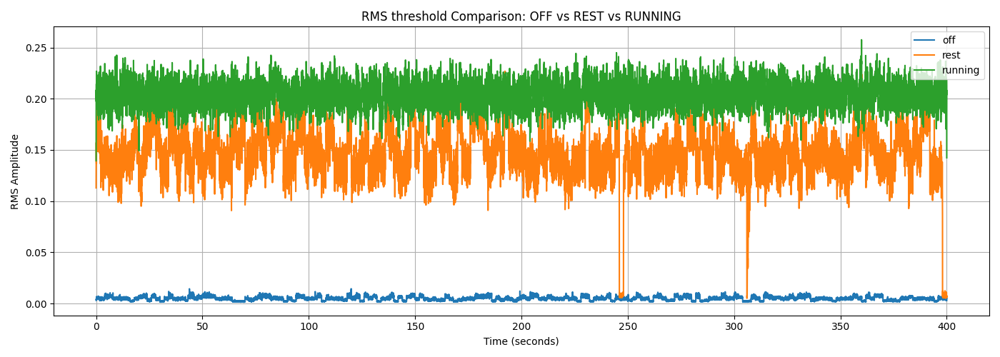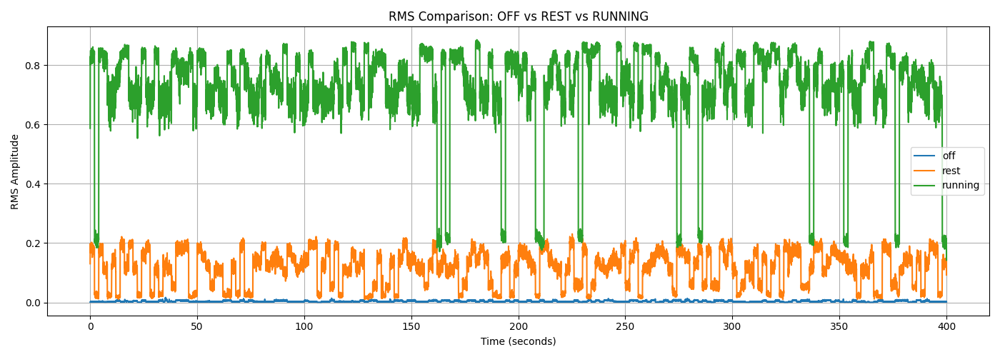

---
## 4.8 graphs and confusion matrix
---
1. off
---
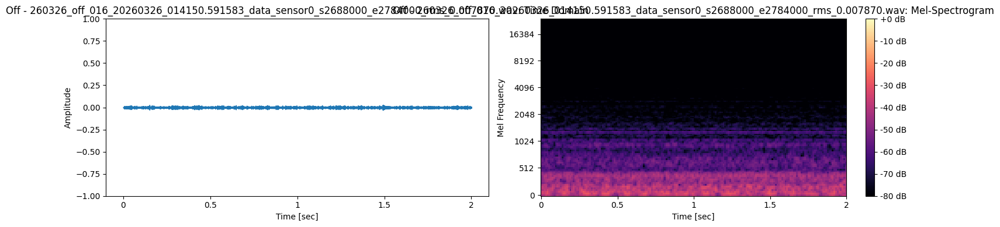
---

2. rest
---
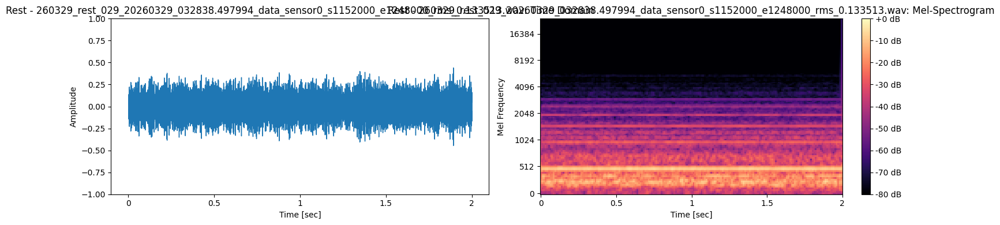
---
3. running
---
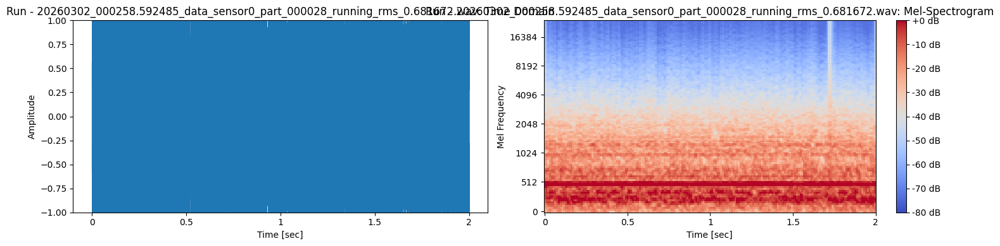
---

## confusion matrix:
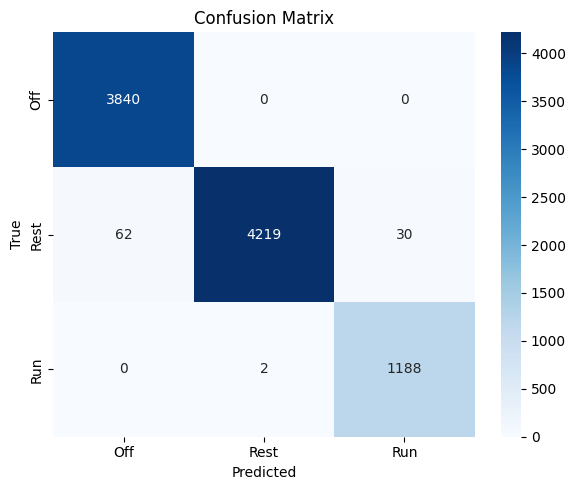
---

# 5. Output Interpretation
## 5.1 Model Output Format

The system generates:

- Prediction Label
- Confidence Score
- RMS Value
- Timestamp

```
output = {
    "timestamp": "2026-04-26 10:01:05",
    "prediction": "RUNNING",
    "confidence": 0.97,
    "rms": 0.182,
    "class_id": 2
}

output
```
## 5.2 RMS Interpretation
```
def rms_interpretation(rms):
    if rms < 0.01:
        return "OFF state"
    elif rms < 0.08:
        return "REST state"
    elif rms < 0.25:
        return "RUNNING state"
    else:
        return "UNKNOWN / Noise"
```
## 5.3 Final Decision Logic
```
def final_decision(pred, conf, rms):

    if conf < 0.70:
        return "UNKNOWN - Low confidence"

    if pred == "RUNNING" and rms > 0.05:
        return "RUNNING - Normal operation"

    elif pred == "REST":
        return "REST - Idle machine"

    elif pred == "OFF":
        return "OFF - Machine stopped"

    return "UNKNOWN - Check system"

```
## 5.4 Industrial Interpretation

- Continuous RUNNING → Normal operation  
- OFF during RUNNING cycle → Possible fault  
- Frequent UNKNOWN → Noise or sensor issue  
- Extended REST → Idle inefficiency  

This system is used for:

- Predictive maintenance  
- Fault detection  
- Real-time monitoring  

---

## 5.5 Grafana Dashboard
Overview

The Grafana dashboard is used to visualize real-time and historical data collected from the air compressor monitoring system. It provides an intuitive interface for operators to observe system states (e.g., Running, Rest, Off) and key signal metrics such as RMS (Root Mean Square) sound levels.

System Integration Architecture

The dashboard is integrated with the backend data pipeline as follows:

Data Source: MySQL database stores timestamped sensor data

Data Collection: Python script processes WAV audio and extracts RMS values

Monitoring Protocol: MTConnect agent streams machine data

Visualization Layer: Grafana queries and displays this data

###Dashboard Components:

---
1. Time-Series Panel (RMS Sound Levels)
Displays RMS values over time
- X-axis: Timestamp
- Y-axis: RMS amplitude

Helps identify transitions between machine states

Purpose:
To visually distinguish between:

Low RMS → Off condition
Medium RMS → Rest condition
High RMS → Running condition

---
2. State Indicator Panel
Displays current compressor state:
- RUNNING
- REST
- OFF
- UNKNOWN (fallback case)

Implementation:

Uses threshold-based classification or ML model output
Data queried from the database field: vacuum_state

---
3. Threshold Visualization
Horizontal lines indicating predefined RMS thresholds:
Example:

* Off: RMS < 0.03
* Rest: 0.03 ≤ RMS < 0.2
* Run: RMS ≥ 0.2

Purpose:
Provides quick visual validation of classification logic.

---
4. Real-Time Monitoring Panel
Refresh interval: 1–5 seconds
Displays live updates from the system

Use Case:
Allows operators to immediately detect abnormal behavior.

---
5. Historical Data Analysis
Enables time-range selection (last 5 min, 1 hr, 24 hr, etc.)
Useful for:
Performance tracking
Fault detection
Maintenance planning

---

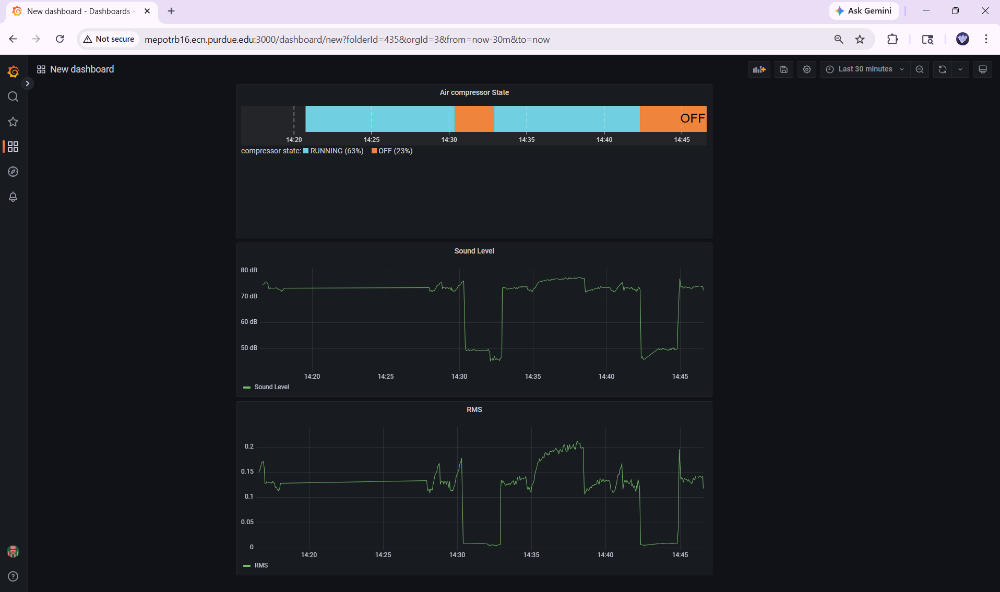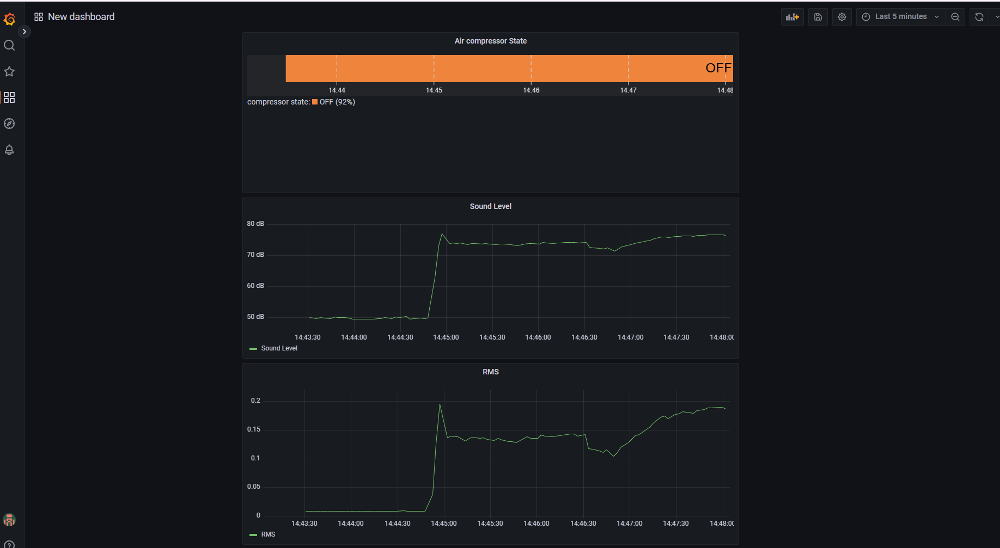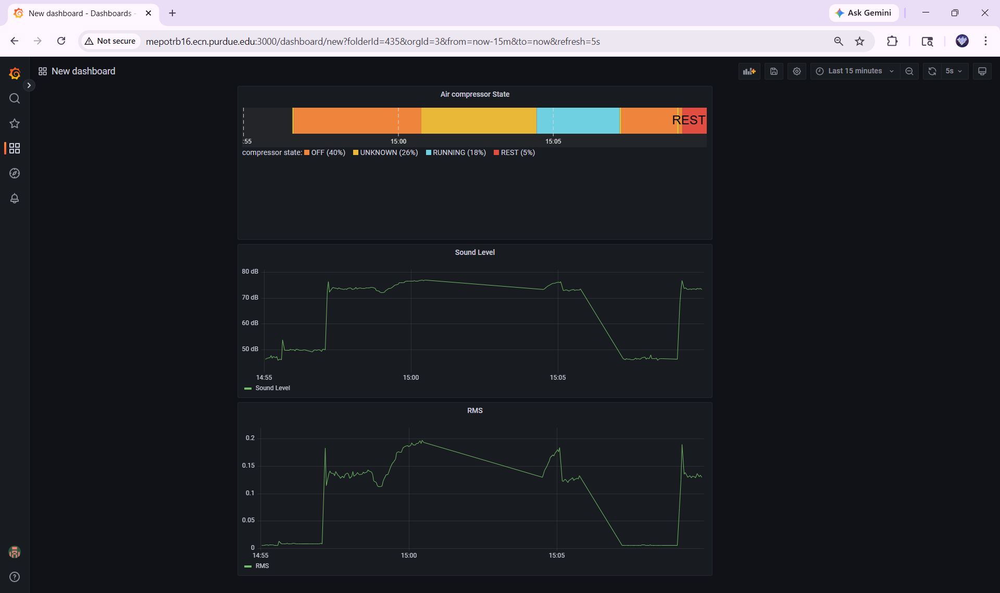

<h3>Figure 1: Air Compressor Monitoring Setup</h3>

<img src="https://drive.google.com/uc?id=1BRmm3396HRPIUFpIlSYBE4ai-6ZnM7-4" width="80%">

<p>
This figure shows the experimental setup used for the air compressor sound monitoring project.
The setup includes the air compressor, sound/stethoscope sensor arrangement, and data collection environment.
</p>

In [ ]:
from IPython.display import HTML

video_off = "https://drive.google.com/file/d/1lOLA-dZDZXekaaZ4EIa0apDgPKcbKssM/preview"
video_rest = "https://drive.google.com/file/d/1tEaGETc6KiXVdR65jvdWCR7Sqjk9lJzx/preview"

HTML(f"""
<h3>OFF Condition</h3>
<iframe src="{video_off}" width="720" height="480" allowfullscreen></iframe>

<br><br>

<h3>REST Condition</h3>
<iframe src="{video_rest}" width="720" height="480" allowfullscreen></iframe>
""")

In [ ]:
!pip install pysoundfile
!pip install bitstring

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.8/76.8 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 343.6/343.6 kB 26.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 423.5/423.5 kB 31.3 MB/s eta 0:00:00


In [1]:
!pip install gdown librosa soundfile -q

import gdown
import librosa
import soundfile as sf
from IPython.display import Audio, display

file_id = "19EcvTCyw-ovcRcUtJ0qoKR0dE_vPVMus"

gdown.download(
    f"https://drive.google.com/uc?id={file_id}",
    "audio.wav",
    quiet=False
)

y, sr = librosa.load("audio.wav", sr=None)

short_audio = y[:100 * sr]
sf.write("short_audio.wav", short_audio, sr)

display(Audio("short_audio.wav"))

Downloading...
From: https://drive.google.com/uc?id=19EcvTCyw-ovcRcUtJ0qoKR0dE_vPVMus
To: /content/audio.wav
100%|██████████| 20.5M/20.5M [00:00<00:00, 82.2MB/s]
